Setup libraries

In [1]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
# from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray
import matplotlib.pyplot as plt
import joblib
# comment


Define catalogue

In [2]:
min_lat = -18.20459
min_lon = 178.33041
max_lat = -18.10000 
max_lon = 178.53506
bbox = [min_lon, min_lat, max_lon, max_lat]

In [3]:
# Define training data

gdf = gpd.read_file("training_data/south_suva_tdata_14022025.geojson")
gdf = gdf.to_crs("EPSG:4326")
gdf.explore(column="cc_id", legend=True)


In [4]:
print(len(gdf))
gdf

3534


,coastal_class,cc_id,date,fid,%_cover,Minor_ecos,Notes,Photo_1,Photo_2,Surveyor,layer,path,geometry
0,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51852 -18.17166 0)
1,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51851 -18.17192 0)
2,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51878 -18.17209 0)
3,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.5188 -18.17181 0)
4,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51875 -18.17157 0)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3529,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49341 -18.12564 0)
3530,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49213 -18.12832 0)
3531,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49111 -18.12963 0)
3532,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.48629 -18.13339 0)


In [6]:
# Open the Zarr dataset
suva_postcard = xr.open_zarr("preprocessing/suva-masked-geomad-v2-2024.zarr", consolidated=True)

# Print dataset details
print(suva_postcard)

<xarray.Dataset> Size: 178MB
Dimensions:      (band: 17, y: 1219, x: 2279)
Coordinates:
  * band         (band) <U8 544B 'nir' 'red' 'blue' ... 'rededge2' 'rededge3'
    spatial_ref  int32 4B ...
    time         datetime64[ns] 8B ...
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
Data variables: (12/16)
    bcmad        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    blue         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    coastal      (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    count        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    emad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    green        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    ...           ...
    rededge1     (y, x) float32 11MB

In [7]:
# data = utils.load_data
# data = load_data(items, bbox)

In [8]:
suva_postcard

<xarray.Dataset> Size: 178MB
Dimensions:      (band: 17, y: 1219, x: 2279)
Coordinates:
  * band         (band) <U8 544B 'nir' 'red' 'blue' ... 'rededge2' 'rededge3'
    spatial_ref  int32 4B ...
    time         datetime64[ns] 8B ...
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
Data variables: (12/16)
    bcmad        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    blue         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    coastal      (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    count        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    emad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    green        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    ...           ...
    rededge1     (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    rededge2     (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    rededge3     (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    smad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    swir16       (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    swir22       (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>

In [9]:
suva_postcard.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


/srv/conda/envs/notebook/lib/python3.10/site-packages/odc/geo/_rgba.py:56: RuntimeWarning: invalid value encountered in cast
  return x.astype("uint8")
/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


In [10]:
suva_postcard = suva_postcard.to_array(dim="band")

# First transform the training points to the same CRS as the data
training = gdf.to_crs(suva_postcard.odc.geobox.crs)

In [11]:
# Next get the X and Y values out of the point geometries
training_da = training.assign(x=training.geometry.x, y=training.geometry.y).to_xarray()
training_da

<xarray.Dataset> Size: 438kB
Dimensions:        (index: 3534)
Coordinates:
  * index          (index) int64 28kB 0 1 2 3 4 5 ... 3529 3530 3531 3532 3533
Data variables: (12/15)
    coastal_class  (index) object 28kB 'seagrass' 'seagrass' ... 'deeps' 'deeps'
    cc_id          (index) int32 14kB 4 4 4 4 4 4 4 4 4 4 ... 8 8 8 8 8 8 8 8 8
    date           (index) object 28kB None None None None ... None None None
    fid            (index) float64 28kB nan nan nan nan nan ... nan nan nan nan
    %_cover        (index) float64 28kB nan nan nan nan nan ... nan nan nan nan
    Minor_ecos     (index) object 28kB None None None None ... None None None
    ...             ...
    Surveyor       (index) object 28kB None None None None ... None None None
    layer          (index) object 28kB 'consolidated_3' ... None
    path           (index) object 28kB 'C:/Users/nicholasm/OneDrive - SPC/Doc...
    geometry       (index) geometry 28kB <class 'xarray.core.extension_array....
    x              (index) float64 28kB 3.175e+06 3.175e+06 ... 3.17e+06
    y              (index) float64 28kB -2.044e+06 -2.044e+06 ... -2.04e+06

In [12]:
# Now we can use the x and y values (lon, lat) to extract values from the median composite
training_values = (
    suva_postcard.sel(training_da[["x", "y"]], method="nearest").squeeze().compute().to_pandas()
)
training_values

index,0,1,2,3,4,5,6,7,8,9,...,3524,3525,3526,3527,3528,3529,3530,3531,3532,3533
band,,,,,,,,,,,,,,,,,,,,,
bcmad,0.000026,0.000024,0.000022,0.000023,0.000023,0.000025,0.000023,0.000025,0.000025,0.000026,...,0.000029,0.000027,0.000031,0.000037,0.000027,0.000026,0.000028,0.000029,0.000043,0.000032
blue,0.060900,0.065700,0.066100,0.059000,0.058500,0.055200,0.058300,0.060200,0.066600,0.059400,...,0.055400,0.052200,0.057600,0.057600,0.046000,0.049300,0.053500,0.055600,0.063900,0.053500
coastal,0.060900,0.059800,0.058600,0.054900,0.052900,0.050300,0.054100,0.055300,0.058000,0.054700,...,0.054400,0.052000,0.056800,0.059900,0.047300,0.048100,0.053800,0.054500,0.065400,0.056200
count,0.002900,0.002800,0.002600,0.002600,0.002500,0.002500,0.002500,0.002500,0.002500,0.002500,...,0.002500,0.002600,0.002200,0.002300,0.002200,0.002200,0.002500,0.002600,0.002600,0.002500
emad,0.087519,0.088532,0.083144,0.068808,0.060051,0.059695,0.069015,0.072418,0.076758,0.070789,...,0.071085,0.059796,0.081073,0.081550,0.051987,0.060282,0.065890,0.071145,0.107303,0.064820
green,0.068900,0.076400,0.078400,0.068900,0.066800,0.062900,0.066600,0.070400,0.078800,0.068500,...,0.058300,0.055500,0.063000,0.064100,0.050900,0.054500,0.056900,0.058700,0.064200,0.056400
nir,0.036800,0.037500,0.037800,0.032900,0.031600,0.025400,0.034000,0.035900,0.038900,0.033900,...,0.027100,0.023000,0.027800,0.029200,0.017200,0.020200,0.022800,0.025300,0.033000,0.021800
nir08,0.035800,0.036400,0.035100,0.029800,0.026800,0.022600,0.031200,0.033200,0.035700,0.031400,...,0.025900,0.023100,0.027200,0.030500,0.016700,0.019400,0.022500,0.025500,0.032200,0.022400
nir09,0.049600,0.043300,0.046400,0.035700,0.031900,0.029800,0.032500,0.033400,0.035400,0.032500,...,0.039100,0.036000,0.045500,0.049800,0.019600,0.031200,0.033300,0.038000,0.065500,0.031300


In [13]:
# Join the training data with the extracted values and remove unnecessary columns
training_array = pd.concat([training["cc_id"], training_values.transpose()], axis=1)

# # Drop rows where there was no data available
# training_array = training_array.dropna()

# Preview our resulting training array
training_array.head()

,cc_id,bcmad,blue,coastal,count,emad,green,nir,nir08,nir09,red,rededge1,rededge2,rededge3,smad,swir16,swir22
0,4,0.000026,0.0609,0.0609,0.0029,0.087519,0.0689,0.0368,0.0358,0.0496,0.0519,0.0606,0.0389,0.0421,0.000007,0.0232,0.0203
1,4,0.000024,0.0657,0.0598,0.0028,0.088532,0.0764,0.0375,0.0364,0.0433,0.0584,0.0639,0.0397,0.0436,0.000006,0.0222,0.0195
2,4,0.000022,0.0661,0.0586,0.0026,0.083144,0.0784,0.0378,0.0351,0.0464,0.0604,0.0649,0.0385,0.0417,0.000006,0.0202,0.0179
3,4,0.000023,0.0590,0.0549,0.0026,0.068808,0.0689,0.0329,0.0298,0.0357,0.0519,0.0564,0.0332,0.0363,0.000006,0.0190,0.0171
4,4,0.000023,0.0585,0.0529,0.0025,0.060051,0.0668,0.0316,0.0268,0.0319,0.0483,0.0527,0.0300,0.0326,0.000005,0.0184,0.0163


In [14]:
len(training_array)

3534

In [15]:
# The classes are the first column
classes = np.array(training_array)[:, 0]

# The observation data is everything after the first column
observations = np.array(training_array)[:, 1:]

# Create a model...
classifier = RandomForestClassifier()

# ...and fit it to the data
model = classifier.fit(observations, classes)

In [16]:
# Convert to a stacked array of observations
stacked_arrays = suva_postcard.stack(dims=["y", "x"]).transpose()

# Predict the classes
predicted = model.predict(stacked_arrays)

# Reshape back to the original 2D array
array = predicted.reshape(len(suva_postcard.y), len(suva_postcard.x))

# Convert to an xarray again, because it's easier to work with
predicted_da = xr.DataArray(
    array, coords={"y": suva_postcard.y, "x": suva_postcard.x}, dims=["y", "x"]
)

In [17]:
print(predicted_da.dtype)  # Check the dtype of your DataArray
predicted_da = predicted_da.astype('float32')  # Convert to float32

float64


In [18]:

# Check for NaN values
if np.isnan(predicted_da).any():
    print("NaN values found in the data")
    # Handle NaN values, e.g. by filling them
    predicted_da = predicted_da.fillna(0)  # Replace NaN with 0 or appropriate value

In [19]:
# Check if CRS is set, if not set it
# if not [predicted_da.rio.crs:
#     predicted_da = predicted_da.rio.write_crs("EPSG:4326")  # Set to appropriate CRS

In [20]:
# Put it all on a single interactive map
# center = [np.mean([min_lat[0], max_lat[0]]), np.mean([min_lat[1], max_lat[1]])]
# m = folium.Map(location=center, zoom_start=11)

center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]  # Assuming min_lon and max_lon are defined
m = folium.Map(location=center, zoom_start=13)



# RGB for the median
# predicted_da.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=0.3).odc.add_to(m, name="Median Composite")


# Categorical for the predicted classes and for the training data
predicted_da.odc.add_to(m, name="Predicted")
gdf.explore(m=m, column="cc_id", legend=True, name="Training Data")

# Layer control
folium.LayerControl().add_to(m)

m

In [21]:
# Suppose 'model' is your trained model object
joblib.dump(model, "models/suva-model-geomad-v2-rf-19022025.model")


['models/suva-model-geomad-v2-rf-19022025.model']

In [22]:
# predicted_da.odc.write_cog("predicted_suva_navakavu_rf_14022025.tif", overwrite=True)

In [23]:
# predicted_da.to_zarr("predictions/prediction-suva-geomad-v2-2024-19022025.zarr")

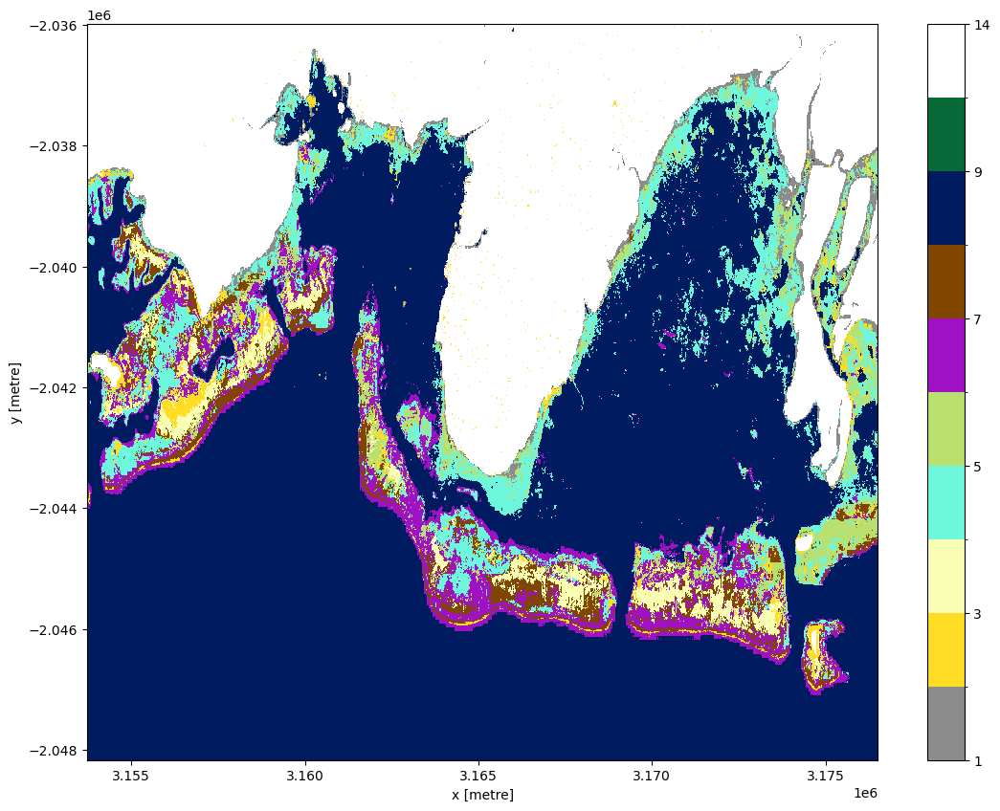

In [24]:
from matplotlib import colors

classes = [
    [1, "sediment", "#8c8c8c"],
    [2, "sand", "#fedd24"],
    [3, "rubble", "#f8ffb4"],
    [4, "seagrass", "#6df7dc"],
    [5, "seaweed", "#b9df6f"],
    [6, "coral", "#a011c3"],
    [7, "rock", "#804600"],
    [8, "deeps", "#011b61"],
    [9, "mangrove", "#086a39"],
    [10, "land", "#ffffff"],
]

values_list = [c[0] for c in classes]
color_list = [c[2] for c in classes]

# Build a listed colormap.
c_map = colors.ListedColormap(color_list)
bounds = values_list + [14]
norm = colors.BoundaryNorm(bounds, c_map.N)

predicted_da.plot.imshow(cmap=c_map, norm=norm, size=10)

## Accuracy assessment

In [25]:
gdf

,coastal_class,cc_id,date,fid,%_cover,Minor_ecos,Notes,Photo_1,Photo_2,Surveyor,layer,path,geometry
0,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51852 -18.17166 0)
1,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51851 -18.17192 0)
2,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51878 -18.17209 0)
3,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.5188 -18.17181 0)
4,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51875 -18.17157 0)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3529,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49341 -18.12564 0)
3530,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49213 -18.12832 0)
3531,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49111 -18.12963 0)
3532,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.48629 -18.13339 0)


In [26]:
# Get unique values from the column
unique_values = gdf['coastal_class'].unique()

# Print each unique value
for value in unique_values:
    print(value)

seagrass
coral
seaweed
deeps
land
sand
sediment
mangrove
rubble
rock


In [27]:
from sklearn.model_selection import train_test_split

In [28]:
print(len(training_array), len(gdf))  # Check the lengths of both arrays

3534 3534


In [29]:
print(training_array.shape)  # Should print (n_samples, n_features)
print(gdf.cc_id.shape)  # Should print (n_samples,)

(3534, 17)
(3534,)


In [30]:
# If needed, trim one array to match the other's length
# gdf = gdf[1:len(gdf)]

### Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)   

Where:  
X contains the features (input variables) of your dataset (the independent variables / attributes used as predictors. The columns of the dataset including the bands etc...)   
y contains the labels (target variable).  (the target - the randomforest column / class column that states what the land cover type is. This is the target / final objective of the classification)

In this case:   
X = training_array   
y = gdf.randomforest


In [31]:
X_train, X_test, y_train, y_test = train_test_split(training_array, gdf.cc_id, test_size=0.2, random_state=42)

In [32]:
y_train = y_train.astype(int)

In [33]:
# Train your model
model.fit(X_train, y_train)

RandomForestClassifier()

In [34]:
# Make predictions
y_pred = model.predict(X_test)

<Figure size 1200x1000 with 0 Axes>

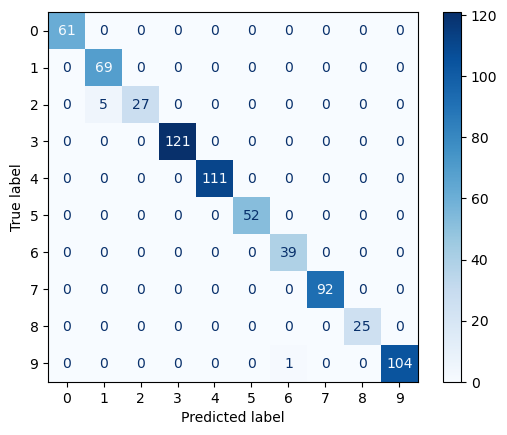

In [35]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
plt.figure(figsize=(12, 10))  # Adjust width and height for larger plot
cm_display.plot(cmap='Blues')

In [36]:
cm

array([[ 61,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,  69,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   5,  27,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 121,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 111,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,  52,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,  39,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,  92,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  25,   0],
       [  0,   0,   0,   0,   0,   0,   1,   0,   0, 104]])

In [37]:
from sklearn.metrics import accuracy_score

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.4f}')

Accuracy: 0.9915


In [38]:
gdf

,coastal_class,cc_id,date,fid,%_cover,Minor_ecos,Notes,Photo_1,Photo_2,Surveyor,layer,path,geometry
0,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51852 -18.17166 0)
1,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51851 -18.17192 0)
2,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51878 -18.17209 0)
3,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.5188 -18.17181 0)
4,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51875 -18.17157 0)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3529,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49341 -18.12564 0)
3530,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49213 -18.12832 0)
3531,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49111 -18.12963 0)
3532,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.48629 -18.13339 0)


In [39]:
from sklearn.metrics import classification_report

# report = classification_report(true_labels, predicted_labels, target_names=class_labels)
# print(report)

report = classification_report(y_test, y_pred, target_names=['sediment', 'sand', 'rubble', 'seagrass', 'seaweed', 'coral', 'rock', 'deeps', 'mangrove', 'land'])
print(report)

              precision    recall  f1-score   support

    sediment       1.00      1.00      1.00        61
        sand       0.93      1.00      0.97        69
      rubble       1.00      0.84      0.92        32
    seagrass       1.00      1.00      1.00       121
     seaweed       1.00      1.00      1.00       111
       coral       1.00      1.00      1.00        52
        rock       0.97      1.00      0.99        39
       deeps       1.00      1.00      1.00        92
    mangrove       1.00      1.00      1.00        25
        land       1.00      0.99      1.00       105

    accuracy                           0.99       707
   macro avg       0.99      0.98      0.99       707
weighted avg       0.99      0.99      0.99       707



In [40]:
print("Unique labels in y_test:", np.unique(y_test))
print("Unique labels in y_pred:", np.unique(y_pred))

Unique labels in y_test: [ 1  2  3  4  5  6  7  8  9 10]
Unique labels in y_pred: [ 1  2  3  4  5  6  7  8  9 10]


In [41]:
print("Length of y_test:", len(y_test))
print("Length of y_pred:", len(y_pred))

Length of y_test: 707
Length of y_pred: 707
